Shape: (30775, 5)

Columns: ['osm_id', 'code', 'fclass', 'name', 'geometry']

First few rows:
    osm_id  code fclass            name  \
0  2838058  7202   park            None   
1  2903046  7202   park            None   
2  2903368  7202   park            None   
3  2903369  7202   park            None   
4  2903398  7202   park  Bush Hill Park   

                                            geometry  
0  POLYGON ((-0.09186 51.66414, -0.09146 51.66418...  
1  POLYGON ((-0.08025 51.66596, -0.08005 51.6669,...  
2  POLYGON ((-0.08663 51.66215, -0.08653 51.66293...  
3  POLYGON ((-0.08266 51.66106, -0.08227 51.66177...  
4  POLYGON ((-0.07064 51.64713, -0.07058 51.64751...  

Data types:
osm_id        object
code           int32
fclass        object
name          object
geometry    geometry
dtype: object

CRS: EPSG:4326


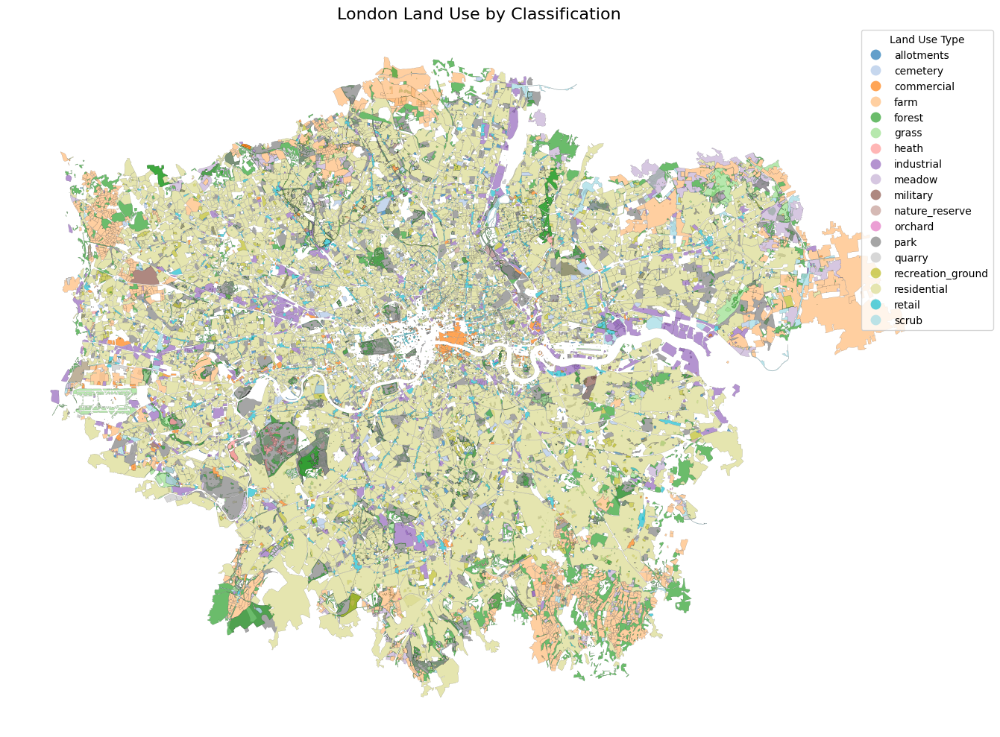

Number of different fclass values: 18

Unique fclass values: ['park' 'forest' 'allotments' 'industrial' 'retail' 'nature_reserve'
 'scrub' 'residential' 'grass' 'cemetery' 'recreation_ground' 'commercial'
 'military' 'farm' 'quarry' 'heath' 'meadow' 'orchard']

Count of each fclass:
fclass
residential          7323
forest               4722
grass                4472
retail               2999
park                 2977
meadow               1741
farm                 1721
industrial           1311
commercial            820
recreation_ground     694
scrub                 680
allotments            674
heath                 238
cemetery              188
nature_reserve        115
military               60
orchard                21
quarry                 19
Name: count, dtype: int64


In [ ]:
import geopandas as gpd

import matplotlib.pyplot as plt

# Read the shapefile
gdf = gpd.read_file('/Users/goffy/Desktop/CASA0004/data-preparation/geographic_shp/Shapefiles_London/01_LondonLanduse.shp')

# Review the data
print("Shape:", gdf.shape)
print("\nColumns:", gdf.columns.tolist())
print("\nFirst few rows:")
print(gdf.head())
print("\nData types:")
print(gdf.dtypes)
print("\nCRS:", gdf.crs)

# Create a color-coded plot by fclass
fig, ax = plt.subplots(figsize=(15, 10))
gdf.plot(column='fclass', ax=ax, legend=True, alpha=0.7, 
         edgecolor='black', linewidth=0.1, cmap='tab20')
ax.set_title('London Land Use by Classification', fontsize=16)
ax.set_axis_off()

# Adjust legend
legend = ax.get_legend()
legend.set_bbox_to_anchor((1.05, 1))
legend.set_title('Land Use Type')

plt.tight_layout()
plt.show()

# Count the number of different fclass values
unique_fclass_count = gdf['fclass'].nunique()
print(f"Number of different fclass values: {unique_fclass_count}")

# Show all unique fclass values
unique_fclass = gdf['fclass'].unique()
print(f"\nUnique fclass values: {unique_fclass}")

# Show the count of each fclass
fclass_counts = gdf['fclass'].value_counts()
print(f"\nCount of each fclass:")
print(fclass_counts)

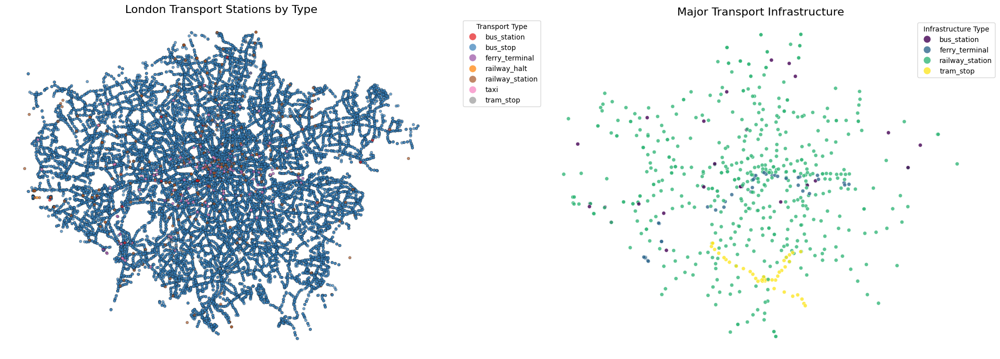

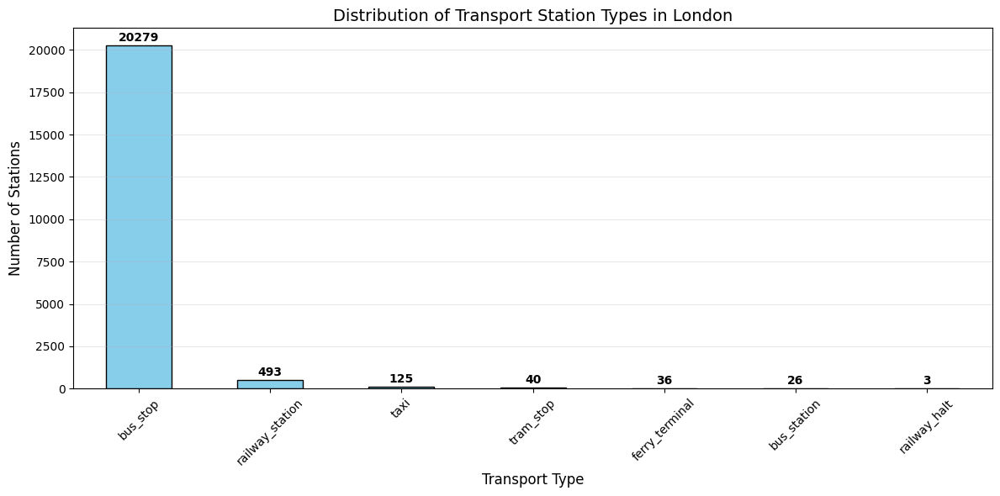

=== TRANSPORT STATIONS SUMMARY ===
Total transport stations: 21,002
Most common type: bus_stop (20,279 stations)
Least common type: railway_halt (3 stations)

=== PERCENTAGE BREAKDOWN ===
bus_stop: 96.56%
railway_station: 2.35%
taxi: 0.6%
tram_stop: 0.19%
ferry_terminal: 0.17%
bus_station: 0.12%
railway_halt: 0.01%


In [ ]:
# Create a more detailed plot with different colors for each transport type
fig_transport, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

# Plot 1: Color-coded by transport type
transport_gdf.plot(column='fclass', ax=ax1, alpha=0.7, markersize=15, 
                   legend=True, cmap='Set1', edgecolor='black', linewidth=0.3)
ax1.set_title('London Transport Stations by Type', fontsize=16)
ax1.set_axis_off()

# Adjust legend for first plot
legend1 = ax1.get_legend()
legend1.set_bbox_to_anchor((1.05, 1))
legend1.set_title('Transport Type')

# Plot 2: Focus on railway and tram stations (larger infrastructure)
major_transport = transport_gdf[transport_gdf['fclass'].isin(['railway_station', 'tram_stop', 'ferry_terminal', 'bus_station'])]
major_transport.plot(column='fclass', ax=ax2, alpha=0.8, markersize=30, 
                     legend=True, cmap='viridis', edgecolor='white', linewidth=0.5)
ax2.set_title('Major Transport Infrastructure', fontsize=16)
ax2.set_axis_off()

# Adjust legend for second plot
legend2 = ax2.get_legend()
legend2.set_bbox_to_anchor((1.05, 1))
legend2.set_title('Infrastructure Type')

plt.tight_layout()
plt.show()

# Create a bar chart of transport types
plt.figure(figsize=(12, 6))
transport_fclass_counts.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Distribution of Transport Station Types in London', fontsize=14)
plt.xlabel('Transport Type', fontsize=12)
plt.ylabel('Number of Stations', fontsize=12)
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.3)

# Add value labels on bars
for i, v in enumerate(transport_fclass_counts.values):
    plt.text(i, v + 100, str(v), ha='center', va='bottom', fontweight='bold')

plt.tight_layout()
plt.show()

# Print summary statistics
print("=== TRANSPORT STATIONS SUMMARY ===")
print(f"Total transport stations: {len(transport_gdf):,}")
print(f"Most common type: {transport_fclass_counts.index[0]} ({transport_fclass_counts.iloc[0]:,} stations)")
print(f"Least common type: {transport_fclass_counts.index[-1]} ({transport_fclass_counts.iloc[-1]} stations)")

# Calculate percentages
transport_percentages = (transport_fclass_counts / len(transport_gdf) * 100).round(2)
print(f"\n=== PERCENTAGE BREAKDOWN ===")
for transport_type, percentage in transport_percentages.items():
    print(f"{transport_type}: {percentage}%")

=== LONDON STREET NETWORK DATA REVIEW ===
Shape: (115305, 2)

Columns: ['FID', 'geometry']

Data types:
FID            int64
geometry    geometry
dtype: object

CRS: EPSG:27700

First few rows:
   FID                                   geometry
0    0  LINESTRING (533496 194642, 533521 194711)
1    1  LINESTRING (532979 195192, 532937 194981)
2    2  LINESTRING (532451 194748, 532358 194770)
3    3  LINESTRING (532358 194770, 532225 194797)
4    4  LINESTRING (532019 194636, 532123 194669)

Missing values:
FID         0
geometry    0
dtype: int64

Numeric columns statistics:
                 FID
count  115305.000000
mean    57652.000000
std     33285.830732
min         0.000000
25%     28826.000000
50%     57652.000000
75%     86478.000000
max    115304.000000


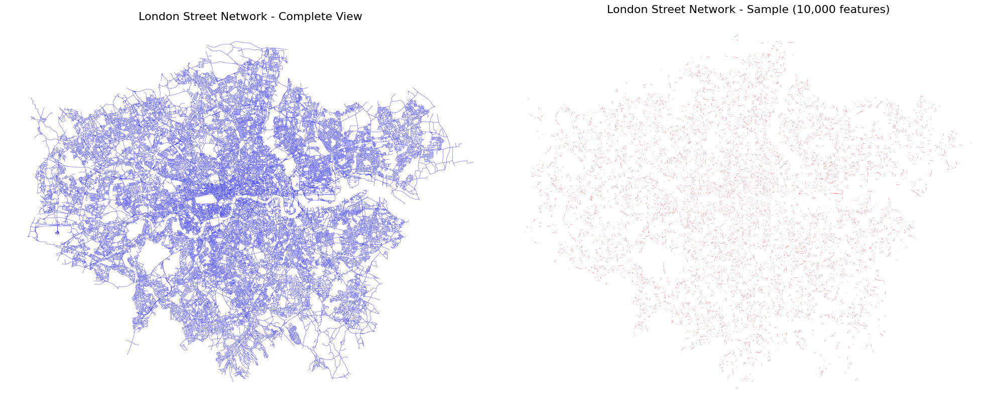

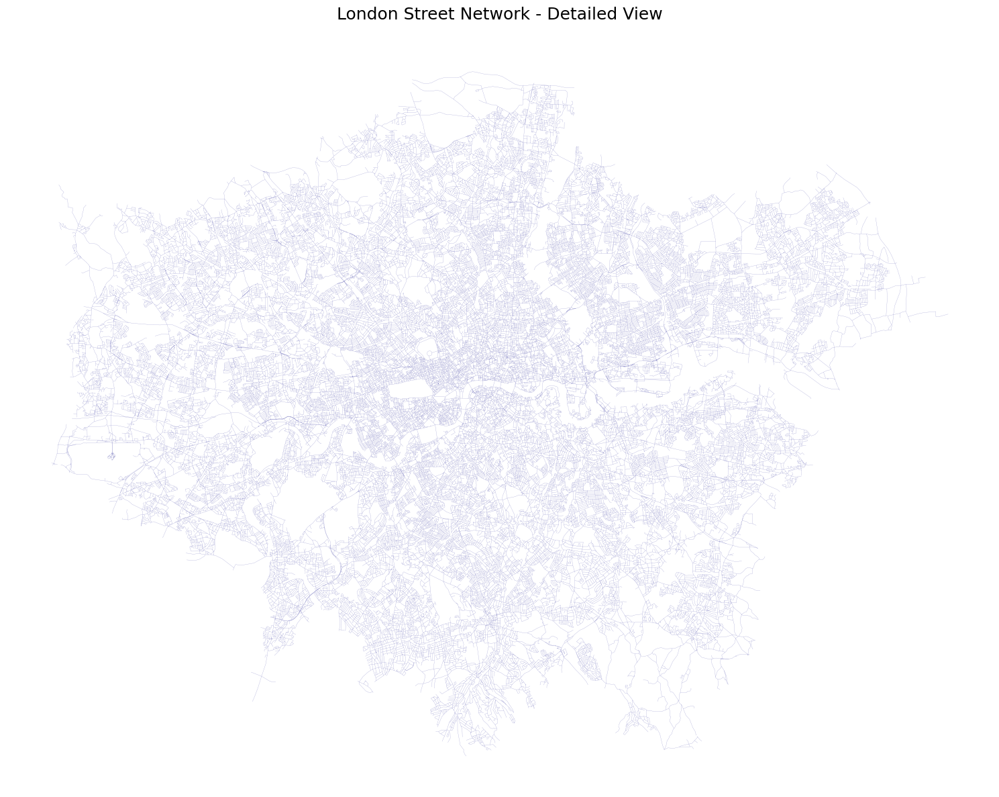


=== SUMMARY STATISTICS ===
Total number of street segments: 115,305
Total street network length: 12669.13 km
Average segment length: 109.87 meters
Median segment length: 87.28 meters
Longest segment: 1483.23 meters
Shortest segment: 0.33 meters

Spatial bounds:
Min X: 503580.333322, Min Y: 156401.689053
Max X: 561924.111281, Max Y: 200900.000000


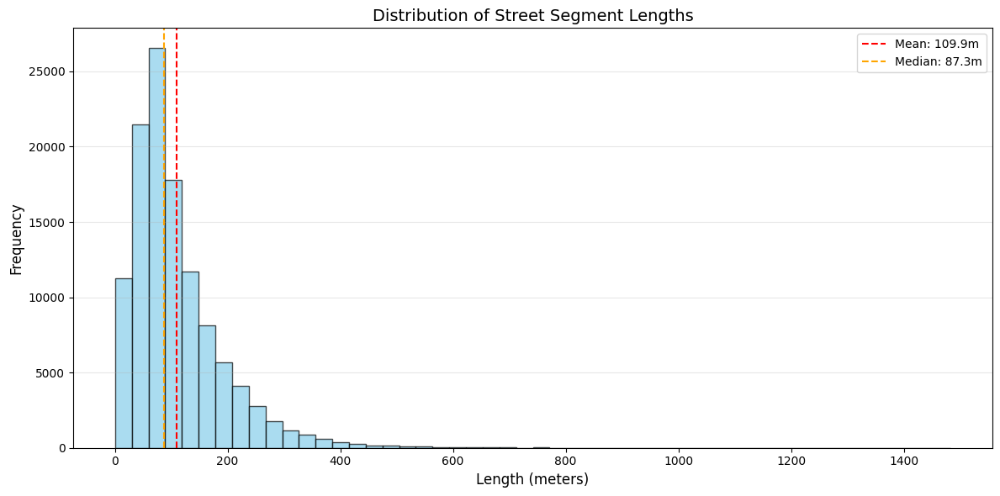

In [ ]:
# Read the London Street Network shapefile
street_gdf = gpd.read_file('/Users/goffy/Desktop/CASA0004/data-preparation/geographic_shp/Shapefiles_London/01_LondonStreetNetwork.shp')

# Review the data structure
print("=== LONDON STREET NETWORK DATA REVIEW ===")
print(f"Shape: {street_gdf.shape}")
print(f"\nColumns: {street_gdf.columns.tolist()}")
print(f"\nData types:")
print(street_gdf.dtypes)
print(f"\nCRS: {street_gdf.crs}")

print(f"\nFirst few rows:")
print(street_gdf.head())

# Check for missing values
print(f"\nMissing values:")
print(street_gdf.isnull().sum())

# Basic statistics for numeric columns
numeric_cols = street_gdf.select_dtypes(include=['number']).columns
if len(numeric_cols) > 0:
    print(f"\nNumeric columns statistics:")
    print(street_gdf[numeric_cols].describe())

# Visualize the street network
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

# Plot 1: Full street network
street_gdf.plot(ax=ax1, color='blue', alpha=0.6, linewidth=0.5)
ax1.set_title('London Street Network - Complete View', fontsize=16)
ax1.set_axis_off()

# Plot 2: Street network with sample for better visibility
sample_size = min(10000, len(street_gdf))
street_sample = street_gdf.sample(n=sample_size, random_state=42)
street_sample.plot(ax=ax2, color='red', alpha=0.8, linewidth=0.3)
ax2.set_title(f'London Street Network - Sample ({sample_size:,} features)', fontsize=16)
ax2.set_axis_off()

plt.tight_layout()
plt.show()

# Create a detailed visualization
fig, ax = plt.subplots(figsize=(15, 15))
street_gdf.plot(ax=ax, color='darkblue', alpha=0.4, linewidth=0.2)
ax.set_title('London Street Network - Detailed View', fontsize=18, pad=20)
ax.set_axis_off()
ax.set_facecolor('lightgray')
fig.patch.set_facecolor('white')

plt.tight_layout()
plt.show()

# Calculate spatial statistics
print(f"\n=== SUMMARY STATISTICS ===")
print(f"Total number of street segments: {len(street_gdf):,}")

# Calculate lengths (convert to projected CRS for accurate measurements)
if street_gdf.crs.is_geographic:
    street_projected = street_gdf.to_crs('EPSG:27700')  # British National Grid
    lengths = street_projected.geometry.length
else:
    lengths = street_gdf.geometry.length

total_length = lengths.sum() / 1000  # Convert to km
length_stats = lengths.describe()

print(f"Total street network length: {total_length:.2f} km")
print(f"Average segment length: {length_stats['mean']:.2f} meters")
print(f"Median segment length: {length_stats['50%']:.2f} meters")
print(f"Longest segment: {length_stats['max']:.2f} meters")
print(f"Shortest segment: {length_stats['min']:.2f} meters")

# Spatial bounds
bounds = street_gdf.total_bounds
print(f"\nSpatial bounds:")
print(f"Min X: {bounds[0]:.6f}, Min Y: {bounds[1]:.6f}")
print(f"Max X: {bounds[2]:.6f}, Max Y: {bounds[3]:.6f}")

# Length distribution visualization
plt.figure(figsize=(12, 6))
plt.hist(lengths, bins=50, alpha=0.7, color='skyblue', edgecolor='black')
plt.title('Distribution of Street Segment Lengths', fontsize=14)
plt.xlabel('Length (meters)', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.grid(axis='y', alpha=0.3)
plt.axvline(length_stats['mean'], color='red', linestyle='--', 
           label=f'Mean: {length_stats["mean"]:.1f}m')
plt.axvline(length_stats['50%'], color='orange', linestyle='--', 
           label=f'Median: {length_stats["50%"]:.1f}m')
plt.legend()
plt.tight_layout()
plt.show()

=== LONDON RAIL NETWORK DATA REVIEW ===
Shape: (11777, 5)

Columns: ['osm_id', 'code', 'fclass', 'name', 'geometry']

Data types:
osm_id        object
code           int32
fclass        object
name          object
geometry    geometry
dtype: object

CRS: EPSG:4326

First few rows:
   osm_id  code  fclass                                name  \
0   30804  6101    rail                    Lea Valley Lines   
1  101298  6103  subway           Hammersmith and City Line   
2  101486  6103  subway           Hammersmith and City Line   
3  101511  6101    rail             Great Western Main Line   
4  282898  6103  subway  Northern Line (High Barnet Branch)   

                                            geometry  
0  LINESTRING (0.00486 51.62793, 0.0062 51.62927,...  
1  LINESTRING (-0.225 51.49366, -0.22506 51.49396...  
2  LINESTRING (-0.20555 51.51954, -0.20514 51.519...  
3  LINESTRING (-0.20407 51.52214, -0.20462 51.522...  
4  LINESTRING (-0.18626 51.61591, -0.18687 51.61384)  

Missing 

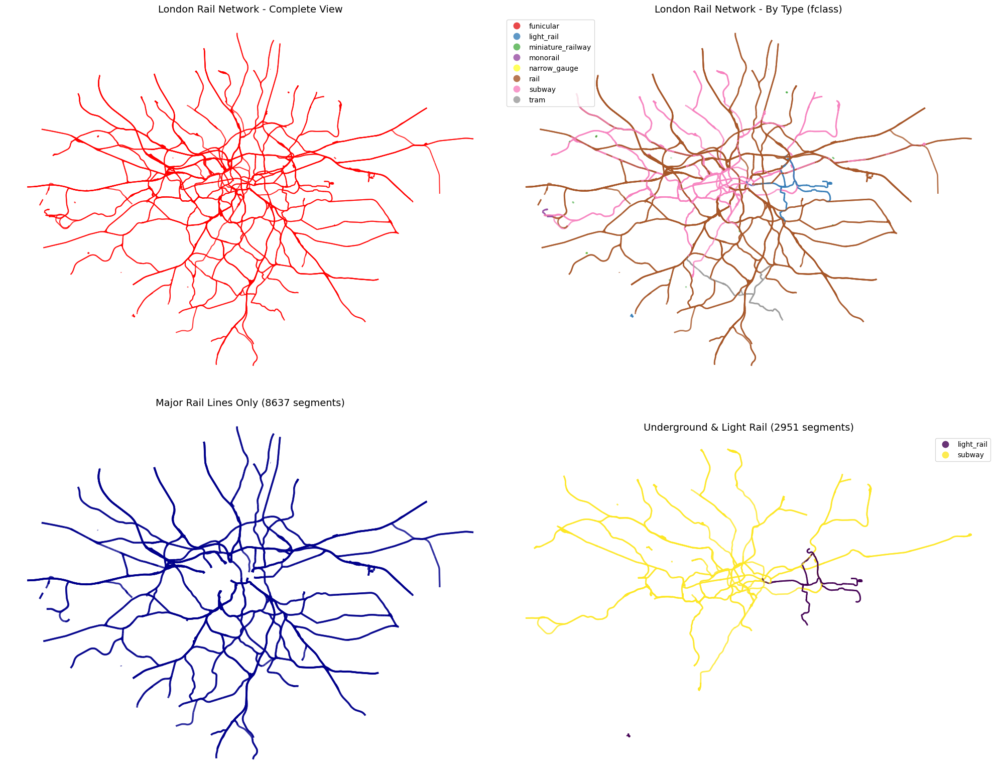

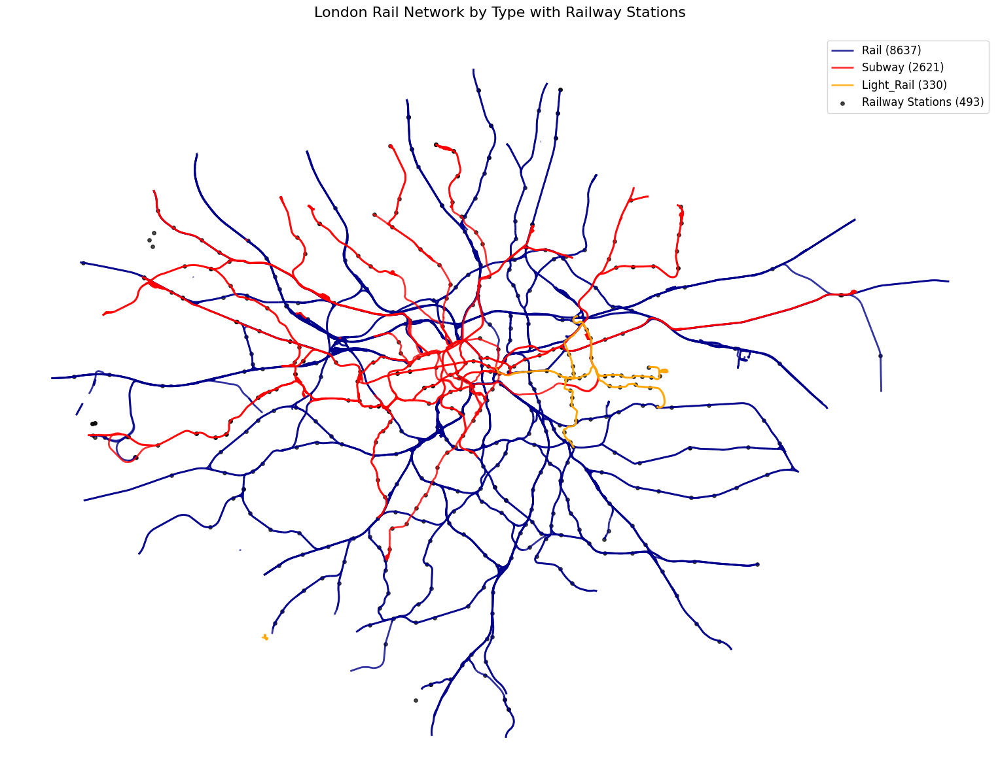


=== RAIL NETWORK DETAILED STATISTICS ===
Total rail network length: 3878.08 km
Total number of rail segments: 11,777
Average segment length: 329.29 meters

=== STATISTICS BY RAIL TYPE ===

RAIL:
  Segments: 8,637
  Total length: 2814.60 km (72.6%)
  Average segment length: 325.88 meters

SUBWAY:
  Segments: 2,621
  Total length: 910.09 km (23.5%)
  Average segment length: 347.23 meters

LIGHT_RAIL:
  Segments: 330
  Total length: 90.97 km (2.3%)
  Average segment length: 275.67 meters

TRAM:
  Segments: 116
  Total length: 52.34 km (1.3%)
  Average segment length: 451.22 meters

MINIATURE_RAILWAY:
  Segments: 34
  Total length: 4.30 km (0.1%)
  Average segment length: 126.39 meters

MONORAIL:
  Segments: 36
  Total length: 5.48 km (0.1%)
  Average segment length: 152.31 meters

NARROW_GAUGE:
  Segments: 2
  Total length: 0.30 km (0.0%)
  Average segment length: 148.53 meters

FUNICULAR:
  Segments: 1
  Total length: 0.01 km (0.0%)
  Average segment length: 8.85 meters

=== NAMED VS UN

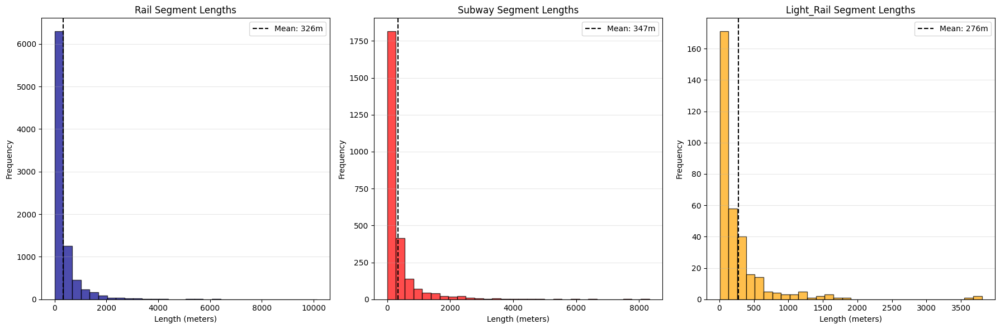


=== NETWORK COMPARISON ===
Rail network length: 3878.08 km
Street network length: 12669.13 km
Rail as % of street network: 30.61%
Rail segments: 11,777
Street segments: 115,305
Railway stations: 493
Average stations per km of rail: 0.13


In [ ]:
# Read the London Rail Network shapefile
rail_gdf = gpd.read_file('/Users/goffy/Desktop/CASA0004/data-preparation/geographic_shp/Shapefiles_London/01_LondonRailNetwork.shp')

# Review the data structure
print("=== LONDON RAIL NETWORK DATA REVIEW ===")
print(f"Shape: {rail_gdf.shape}")
print(f"\nColumns: {rail_gdf.columns.tolist()}")
print(f"\nData types:")
print(rail_gdf.dtypes)
print(f"\nCRS: {rail_gdf.crs}")

print(f"\nFirst few rows:")
print(rail_gdf.head())

# Check for missing values
print(f"\nMissing values:")
print(rail_gdf.isnull().sum())

# Analyze rail network types
print(f"\nRail network types (fclass):")
rail_type_counts = rail_gdf['fclass'].value_counts()
print(rail_type_counts)

print(f"\nRail network type percentages:")
rail_type_percentages = (rail_type_counts / len(rail_gdf) * 100).round(2)
print(rail_type_percentages)

# Check unique values in key columns
print(f"\nUnique rail line names: {rail_gdf['name'].nunique()}")
print(f"Lines with names: {rail_gdf['name'].notna().sum()}")
print(f"Lines without names: {rail_gdf['name'].isna().sum()}")

# Visualize the rail network by type
fig, axes = plt.subplots(2, 2, figsize=(20, 16))

# Plot 1: Full rail network
rail_gdf.plot(ax=axes[0,0], color='red', alpha=0.8, linewidth=1.5)
axes[0,0].set_title('London Rail Network - Complete View', fontsize=14)
axes[0,0].set_axis_off()

# Plot 2: Rail network by type (fclass)
rail_gdf.plot(column='fclass', ax=axes[0,1], alpha=0.8, linewidth=2, 
              legend=True, cmap='Set1', legend_kwds={'loc': 'upper left'})
axes[0,1].set_title('London Rail Network - By Type (fclass)', fontsize=14)
axes[0,1].set_axis_off()

# Plot 3: Major rail lines only (excluding subway/light_rail)
major_rail = rail_gdf[rail_gdf['fclass'] == 'rail']
major_rail.plot(ax=axes[1,0], color='darkblue', alpha=0.8, linewidth=2.5)
axes[1,0].set_title(f'Major Rail Lines Only ({len(major_rail)} segments)', fontsize=14)
axes[1,0].set_axis_off()

# Plot 4: Underground/Metro lines
metro_lines = rail_gdf[rail_gdf['fclass'].isin(['subway', 'light_rail'])]
metro_lines.plot(column='fclass', ax=axes[1,1], alpha=0.8, linewidth=2, 
                 legend=True, cmap='viridis')
axes[1,1].set_title(f'Underground & Light Rail ({len(metro_lines)} segments)', fontsize=14)
axes[1,1].set_axis_off()

plt.tight_layout()
plt.show()

# Create detailed overlay with transport stations
fig, ax = plt.subplots(figsize=(16, 12))

# Plot different rail types with different colors
rail_colors = {'rail': 'darkblue', 'subway': 'red', 'light_rail': 'orange'}
for rail_type, color in rail_colors.items():
    subset = rail_gdf[rail_gdf['fclass'] == rail_type]
    if len(subset) > 0:
        subset.plot(ax=ax, color=color, linewidth=2, alpha=0.8, label=f'{rail_type.title()} ({len(subset)})')

# Overlay railway stations
railway_stations.plot(ax=ax, color='black', markersize=15, alpha=0.7, 
                      label=f'Railway Stations ({len(railway_stations)})')

ax.set_title('London Rail Network by Type with Railway Stations', fontsize=16, pad=20)
ax.set_axis_off()
ax.legend(loc='upper right', fontsize=12)

plt.tight_layout()
plt.show()

# Calculate detailed statistics by rail type
print(f"\n=== RAIL NETWORK DETAILED STATISTICS ===")

# Convert to projected CRS for accurate measurements
rail_projected = rail_gdf.to_crs('EPSG:27700')  # British National Grid
rail_gdf['length_m'] = rail_projected.geometry.length

# Overall statistics
total_rail_length_km = rail_gdf['length_m'].sum() / 1000
print(f"Total rail network length: {total_rail_length_km:.2f} km")
print(f"Total number of rail segments: {len(rail_gdf):,}")
print(f"Average segment length: {rail_gdf['length_m'].mean():.2f} meters")

# Statistics by rail type
print(f"\n=== STATISTICS BY RAIL TYPE ===")
for rail_type in rail_gdf['fclass'].unique():
    subset = rail_gdf[rail_gdf['fclass'] == rail_type]
    type_length_km = subset['length_m'].sum() / 1000
    avg_segment_length = subset['length_m'].mean()
    
    print(f"\n{rail_type.upper()}:")
    print(f"  Segments: {len(subset):,}")
    print(f"  Total length: {type_length_km:.2f} km ({type_length_km/total_rail_length_km*100:.1f}%)")
    print(f"  Average segment length: {avg_segment_length:.2f} meters")

# Named vs unnamed lines
named_lines = rail_gdf[rail_gdf['name'].notna()]
unnamed_lines = rail_gdf[rail_gdf['name'].isna()]

print(f"\n=== NAMED VS UNNAMED RAIL SEGMENTS ===")
print(f"Named segments: {len(named_lines):,} ({len(named_lines)/len(rail_gdf)*100:.1f}%)")
print(f"Unnamed segments: {len(unnamed_lines):,} ({len(unnamed_lines)/len(rail_gdf)*100:.1f}%)")

# Top 10 longest named rail lines
if len(named_lines) > 0:
    line_lengths = named_lines.groupby('name')['length_m'].sum().sort_values(ascending=False)
    print(f"\nTop 10 longest named rail lines:")
    for i, (line_name, length) in enumerate(line_lengths.head(10).items(), 1):
        print(f"{i:2d}. {line_name}: {length/1000:.2f} km")

# Spatial bounds comparison
rail_bounds = rail_gdf.total_bounds
print(f"\n=== SPATIAL COVERAGE ===")
print(f"Rail network bounds:")
print(f"  Longitude: {rail_bounds[0]:.6f} to {rail_bounds[2]:.6f}")
print(f"  Latitude: {rail_bounds[1]:.6f} to {rail_bounds[3]:.6f}")

# Length distribution by type
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

for i, rail_type in enumerate(['rail', 'subway', 'light_rail']):
    if rail_type in rail_gdf['fclass'].values:
        subset = rail_gdf[rail_gdf['fclass'] == rail_type]['length_m']
        axes[i].hist(subset, bins=30, alpha=0.7, color=['darkblue', 'red', 'orange'][i], 
                    edgecolor='black')
        axes[i].set_title(f'{rail_type.title()} Segment Lengths', fontsize=12)
        axes[i].set_xlabel('Length (meters)')
        axes[i].set_ylabel('Frequency')
        axes[i].axvline(subset.mean(), color='black', linestyle='--', 
                       label=f'Mean: {subset.mean():.0f}m')
        axes[i].legend()
        axes[i].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

# Compare with other networks
print(f"\n=== NETWORK COMPARISON ===")
print(f"Rail network length: {total_rail_length_km:.2f} km")
print(f"Street network length: {total_length:.2f} km")
print(f"Rail as % of street network: {(total_rail_length_km/total_length)*100:.2f}%")
print(f"Rail segments: {len(rail_gdf):,}")
print(f"Street segments: {len(street_gdf):,}")
print(f"Railway stations: {len(railway_stations):,}")
print(f"Average stations per km of rail: {len(railway_stations)/total_rail_length_km:.2f}")

=== LONDON LSOA DATA REVIEW ===
Shape: (4719, 7)

Columns: ['code', 'name', 'label', 'Area', 'Half densi', 'Area2', 'geometry']

Data types:
code            object
name            object
label           object
Area             int64
Half densi       int64
Area2           object
geometry      geometry
dtype: object

CRS: EPSG:27700

First few rows:
        code                       name                        label     Area  \
0  E01000037  Barking and Dagenham 003B  E09000002E02000004E01000037   233488   
1  E01033729             Greenwich 030E  E09000011E02000342E01033729   691074   
2  E01000038  Barking and Dagenham 003C  E09000002E02000004E01000038   214094   
3  E01033730             Greenwich 035D  E09000011E02006928E01033730   187153   
4  E01000039  Barking and Dagenham 003D  E09000002E02000004E01000039  1532166   

   Half densi    Area2                                           geometry  
0        3764   233488  POLYGON ((551549.998 187364.637, 551528.633 18...  
1        20

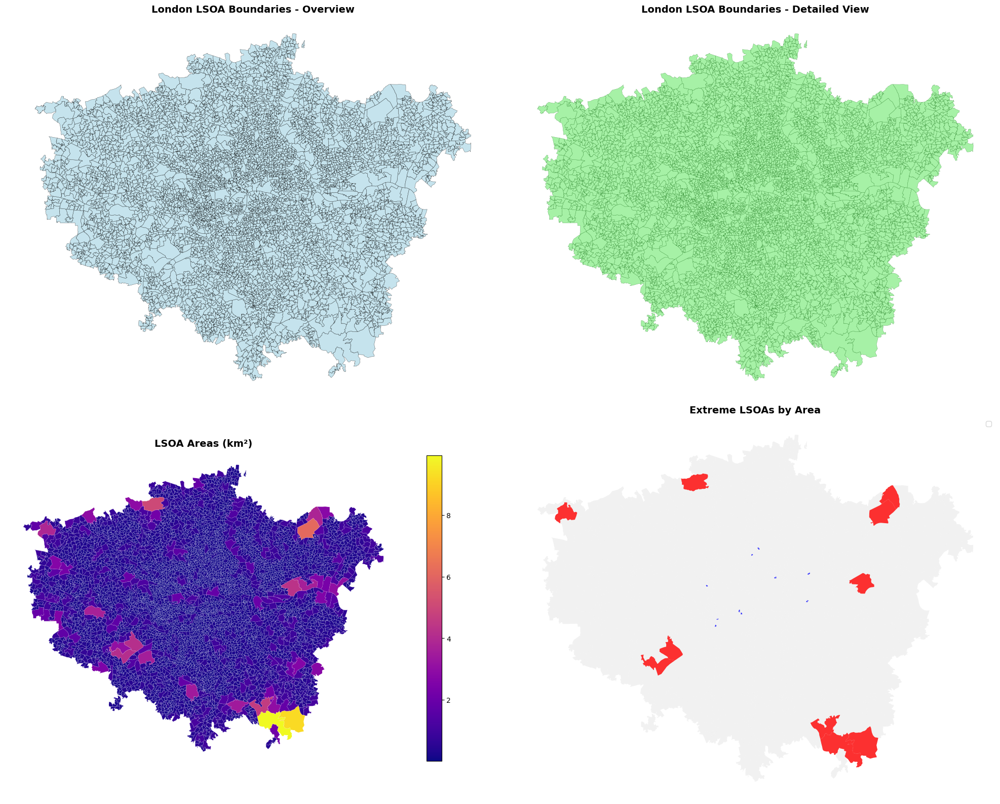

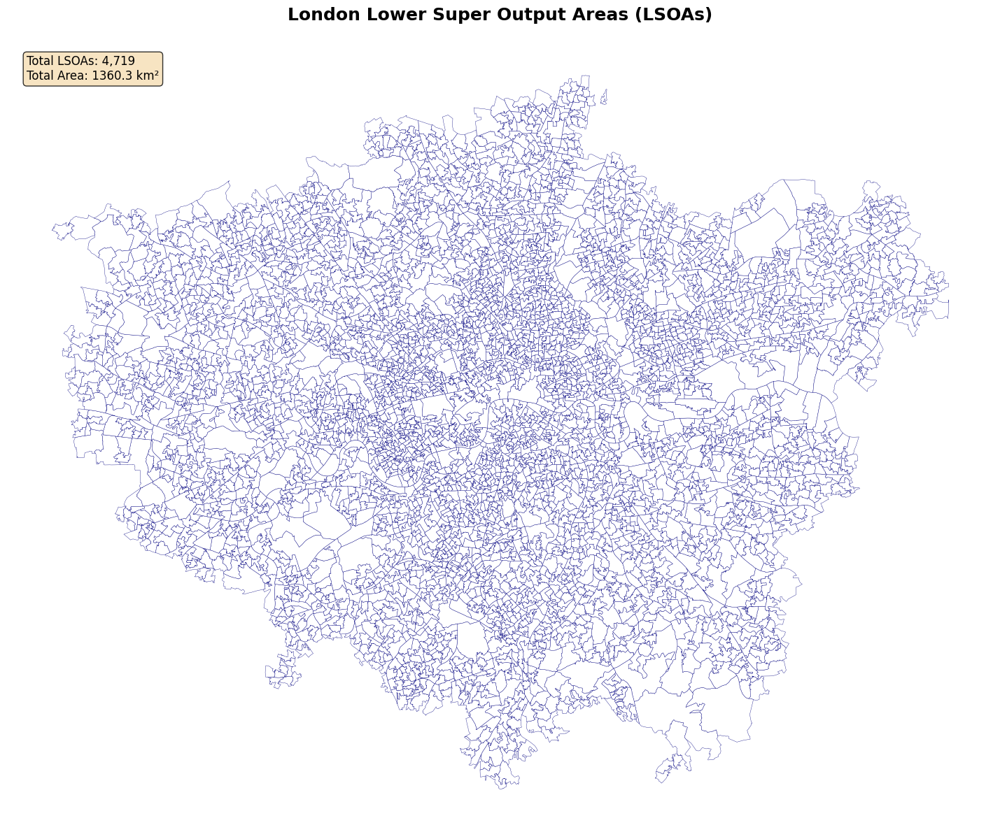


=== ENHANCED LSOA AREA STATISTICS ===
Total London area (LSOA coverage): 1360.28 km²
Average LSOA area: 0.2883 km²
Median LSOA area: 0.2021 km²
Largest LSOA: 9.9331 km²
Smallest LSOA: 0.0184 km²
Standard deviation: 0.3892 km²
Coefficient of variation: 135.0%

Outliers (using IQR method): 363 LSOAs (7.7%)

=== SPATIAL COVERAGE ===
X range: 504409 to 557965 (width: 53556 m)
Y range: 157365 to 200033 (height: 42668 m)


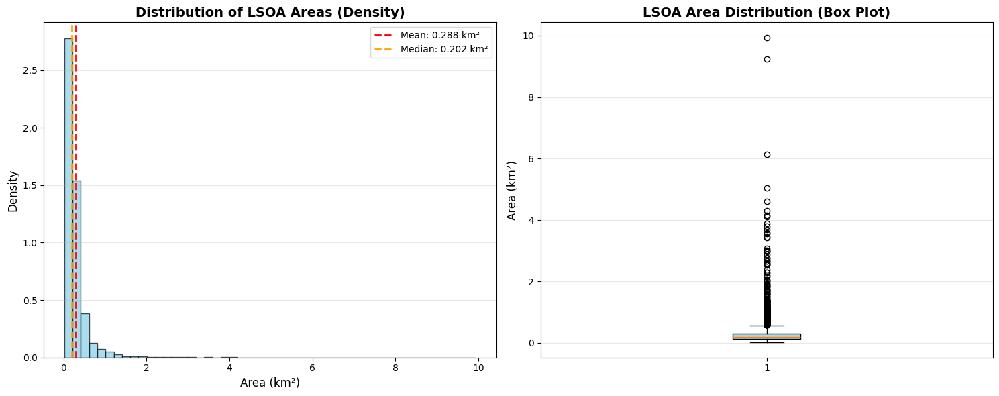


=== TEXT COLUMNS ANALYSIS ===

CODE:
  Unique values: 4,719 (100.0%)
  Null values: 0 (0.0%)
  Sample values: ['E01000001', 'E01000002', 'E01000003', 'E01000005', 'E01000006', 'E01000007', 'E01000008', 'E01000009', 'E01000010', 'E01000011']...

NAME:
  Unique values: 4,719 (100.0%)
  Null values: 0 (0.0%)
  Sample values: ['Barking and Dagenham 001A', 'Barking and Dagenham 001B', 'Barking and Dagenham 001C', 'Barking and Dagenham 001D', 'Barking and Dagenham 002A', 'Barking and Dagenham 002B', 'Barking and Dagenham 002C', 'Barking and Dagenham 002D', 'Barking and Dagenham 002E', 'Barking and Dagenham 002F']...

LABEL:
  Unique values: 4,719 (100.0%)
  Null values: 0 (0.0%)
  Sample values: ['E09000001E02000001E01000001', 'E09000001E02000001E01000002', 'E09000001E02000001E01000003', 'E09000001E02000001E01000005', 'E09000001E02000001E01032739', 'E09000001E02000001E01032740', 'E09000002E02000002E01000027', 'E09000002E02000002E01000028', 'E09000002E02000002E01000029', 'E09000002E02000002E

In [18]:
import warnings

warnings.filterwarnings('ignore')

# Read the London LSOA shapefile
lsoa_gdf = gpd.read_file('/Users/goffy/Desktop/Shapefiles_London/01_LondonLSOA.shp')

# Review the data structure
print("=== LONDON LSOA DATA REVIEW ===")
print(f"Shape: {lsoa_gdf.shape}")
print(f"\nColumns: {lsoa_gdf.columns.tolist()}")
print(f"\nData types:")
print(lsoa_gdf.dtypes)
print(f"\nCRS: {lsoa_gdf.crs}")

print(f"\nFirst few rows:")
print(lsoa_gdf.head())

# Check for missing values
print(f"\nMissing values:")
missing_summary = lsoa_gdf.isnull().sum()
print(missing_summary[missing_summary > 0] if missing_summary.sum() > 0 else "No missing values found")

# Basic statistics
print(f"\nTotal number of LSOAs: {len(lsoa_gdf):,}")

# Calculate area statistics with proper CRS handling
if lsoa_gdf.crs is None:
    print("Warning: No CRS defined for LSOA data. Assuming EPSG:4326 (WGS84)")
    lsoa_gdf = lsoa_gdf.set_crs('EPSG:4326')

if lsoa_gdf.crs.is_geographic:
    print("Converting to British National Grid for accurate area calculations...")
    lsoa_projected = lsoa_gdf.to_crs('EPSG:27700')  # British National Grid
    areas_sq_km = lsoa_projected.geometry.area / 1000000  # Convert to km²
else:
    print("Using projected coordinates for area calculations...")
    areas_sq_km = lsoa_gdf.geometry.area / 1000000

lsoa_gdf['area_sq_km'] = areas_sq_km

# Visualize the LSOA boundaries
fig, axes = plt.subplots(2, 2, figsize=(20, 16))

# Plot 1: Basic LSOA boundaries
lsoa_gdf.plot(ax=axes[0,0], color='lightblue', edgecolor='black', linewidth=0.3, alpha=0.7)
axes[0,0].set_title('London LSOA Boundaries - Overview', fontsize=14, fontweight='bold')
axes[0,0].set_axis_off()

# Plot 2: LSOA with geographic context
lsoa_gdf.plot(ax=axes[0,1], color='lightgreen', edgecolor='darkgreen', linewidth=0.2, alpha=0.8)
axes[0,1].set_title('London LSOA Boundaries - Detailed View', fontsize=14, fontweight='bold')
axes[0,1].set_axis_off()

# Plot 3: Area distribution with improved colormap
im = lsoa_gdf.plot(column='area_sq_km', ax=axes[1,0], legend=True, cmap='plasma', 
                   edgecolor='white', linewidth=0.1, legend_kwds={'shrink': 0.8})
axes[1,0].set_title('LSOA Areas (km²)', fontsize=14, fontweight='bold')
axes[1,0].set_axis_off()

# Plot 4: Outlier analysis - largest and smallest LSOAs
largest_lsoas = lsoa_gdf.nlargest(10, 'area_sq_km')  # Reduced to 10 for clarity
smallest_lsoas = lsoa_gdf.nsmallest(10, 'area_sq_km')

# Plot base map first
lsoa_gdf.plot(ax=axes[1,1], color='lightgray', alpha=0.3, edgecolor='white', linewidth=0.1)
largest_lsoas.plot(ax=axes[1,1], color='red', alpha=0.8, label=f'10 Largest LSOAs (avg: {largest_lsoas["area_sq_km"].mean():.2f} km²)')
smallest_lsoas.plot(ax=axes[1,1], color='blue', alpha=0.8, label=f'10 Smallest LSOAs (avg: {smallest_lsoas["area_sq_km"].mean():.3f} km²)')
axes[1,1].set_title('Extreme LSOAs by Area', fontsize=14, fontweight='bold')
axes[1,1].set_axis_off()
axes[1,1].legend(loc='upper right')

plt.tight_layout()
plt.show()

# Create a comprehensive overview plot
fig, ax = plt.subplots(figsize=(15, 12))
lsoa_gdf.plot(ax=ax, color='white', edgecolor='navy', linewidth=0.3, alpha=0.9)

# Add area-based color coding
divider = make_axes_locatable(ax) if 'make_axes_locatable' in globals() else None
ax.set_title('London Lower Super Output Areas (LSOAs)', fontsize=18, pad=20, fontweight='bold')
ax.set_axis_off()
ax.set_facecolor('lightgray')
fig.patch.set_facecolor('white')

# Add text annotation
textstr = f'Total LSOAs: {len(lsoa_gdf):,}\nTotal Area: {areas_sq_km.sum():.1f} km²'
props = dict(boxstyle='round', facecolor='wheat', alpha=0.8)
ax.text(0.02, 0.98, textstr, transform=ax.transAxes, fontsize=12,
        verticalalignment='top', bbox=props)

plt.tight_layout()
plt.show()

# Enhanced statistics calculation
print(f"\n=== ENHANCED LSOA AREA STATISTICS ===")
area_stats = areas_sq_km.describe()
total_london_area = areas_sq_km.sum()

print(f"Total London area (LSOA coverage): {total_london_area:.2f} km²")
print(f"Average LSOA area: {area_stats['mean']:.4f} km²")
print(f"Median LSOA area: {area_stats['50%']:.4f} km²")
print(f"Largest LSOA: {area_stats['max']:.4f} km²")
print(f"Smallest LSOA: {area_stats['min']:.4f} km²")
print(f"Standard deviation: {area_stats['std']:.4f} km²")
print(f"Coefficient of variation: {(area_stats['std']/area_stats['mean']*100):.1f}%")

# Identify outliers using IQR method
Q1 = area_stats['25%']
Q3 = area_stats['75%']
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers = lsoa_gdf[(lsoa_gdf['area_sq_km'] < lower_bound) | (lsoa_gdf['area_sq_km'] > upper_bound)]
print(f"\nOutliers (using IQR method): {len(outliers)} LSOAs ({len(outliers)/len(lsoa_gdf)*100:.1f}%)")

# Spatial bounds with more detail
lsoa_bounds = lsoa_gdf.total_bounds
extent_width = lsoa_bounds[2] - lsoa_bounds[0]
extent_height = lsoa_bounds[3] - lsoa_bounds[1]

print(f"\n=== SPATIAL COVERAGE ===")
if lsoa_gdf.crs.is_geographic:
    print(f"Longitude range: {lsoa_bounds[0]:.6f}° to {lsoa_bounds[2]:.6f}° (width: {extent_width:.6f}°)")
    print(f"Latitude range: {lsoa_bounds[1]:.6f}° to {lsoa_bounds[3]:.6f}° (height: {extent_height:.6f}°)")
else:
    print(f"X range: {lsoa_bounds[0]:.0f} to {lsoa_bounds[2]:.0f} (width: {extent_width:.0f} m)")
    print(f"Y range: {lsoa_bounds[1]:.0f} to {lsoa_bounds[3]:.0f} (height: {extent_height:.0f} m)")

# Enhanced area distribution visualization
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# Histogram with better binning
ax1.hist(areas_sq_km, bins=50, alpha=0.7, color='skyblue', edgecolor='black', density=True)
ax1.set_title('Distribution of LSOA Areas (Density)', fontsize=14, fontweight='bold')
ax1.set_xlabel('Area (km²)', fontsize=12)
ax1.set_ylabel('Density', fontsize=12)
ax1.grid(axis='y', alpha=0.3)
ax1.axvline(area_stats['mean'], color='red', linestyle='--', linewidth=2,
           label=f'Mean: {area_stats["mean"]:.3f} km²')
ax1.axvline(area_stats['50%'], color='orange', linestyle='--', linewidth=2,
           label=f'Median: {area_stats["50%"]:.3f} km²')
ax1.legend()

# Box plot for better outlier visualization
box_plot = ax2.boxplot(areas_sq_km, patch_artist=True, vert=True)
box_plot['boxes'][0].set_facecolor('lightblue')
ax2.set_title('LSOA Area Distribution (Box Plot)', fontsize=14, fontweight='bold')
ax2.set_ylabel('Area (km²)', fontsize=12)
ax2.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

# Analyze text columns with better formatting
text_columns = lsoa_gdf.select_dtypes(include=['object']).columns
if len(text_columns) > 0:
    print(f"\n=== TEXT COLUMNS ANALYSIS ===")
    for col in text_columns:
        if col != 'geometry':
            unique_count = lsoa_gdf[col].nunique()
            total_count = len(lsoa_gdf)
            null_count = lsoa_gdf[col].isnull().sum()
            
            print(f"\n{col.upper()}:")
            print(f"  Unique values: {unique_count:,} ({unique_count/total_count*100:.1f}%)")
            print(f"  Null values: {null_count:,} ({null_count/total_count*100:.1f}%)")
            
            if unique_count < 20:  # Show all if not too many
                print(f"  All values: {sorted(lsoa_gdf[col].dropna().unique())}")
            else:
                print(f"  Sample values: {sorted(lsoa_gdf[col].dropna().unique())[:10]}...")

# Enhanced comparison with other datasets
print(f"\n=== COMPREHENSIVE DATASET COMPARISON ===")
datasets = {
    'LSOAs': len(lsoa_gdf),
    'Rail network segments': len(rail_gdf),
    'Street network segments': len(street_gdf),
    'Transport stations (all)': len(transport_gdf),
    'Railway stations only': len(railway_stations),
    'Land use polygons': len(gdf)
}

for name, count in datasets.items():
    print(f"{name:<25}: {count:>8,}")

# Enhanced density metrics
print(f"\n=== ENHANCED DENSITY METRICS ===")
print(f"Average LSOA area: {area_stats['mean']:.3f} km²")
print(f"LSOAs per 100 km²: {len(lsoa_gdf)/(total_london_area/100):.1f}")
print(f"Railway stations per LSOA: {len(railway_stations)/len(lsoa_gdf):.3f}")
print(f"Transport facilities per LSOA: {len(transport_gdf)/len(lsoa_gdf):.1f}")
print(f"Railway stations per km²: {len(railway_stations)/total_london_area:.3f}")
print(f"Street segments per LSOA: {len(street_gdf)/len(lsoa_gdf):.1f}")
print(f"Land use polygons per LSOA: {len(gdf)/len(lsoa_gdf):.1f}")

# Area categories analysis
def categorize_area(area):
    if area < 0.1:
        return 'Very Small (<0.1 km²)'
    elif area < 0.2:
        return 'Small (0.1-0.2 km²)'
    elif area < 0.5:
        return 'Medium (0.2-0.5 km²)'
    elif area < 1.0:
        return 'Large (0.5-1.0 km²)'
    else:
        return 'Very Large (>1.0 km²)'

lsoa_gdf['area_category'] = lsoa_gdf['area_sq_km'].apply(categorize_area)
area_category_counts = lsoa_gdf['area_category'].value_counts()

print(f"\n=== LSOA SIZE CATEGORIES ===")
for category, count in area_category_counts.items():
    percentage = count / len(lsoa_gdf) * 100
    print(f"{category:<25}: {count:>4,} ({percentage:>5.1f}%)")